In [1]:
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import datetime
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

from sklearn.metrics import pairwise_distances_argmin_min
from sklearn import metrics

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
#plt.style.use('ggplot')


from itertools import cycle
import networkx as nx



from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
from Bio.Alphabet import IUPAC

from matplotlib_venn import venn2
from matplotlib_venn import venn3
import venn
from lineage import get_lineage_coll, get_lineage_snp
from resistance import get_resistance_snp
from coinfection_functions import import_VCF42_to_pandas, filter_repeats, add_snp_distance, \
                            scatter_vcf_pos, distplot_sns, add_window_distance

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
sample_list = []
vcf_files = []
directory = "somoza"

for file in os.listdir(directory):
    if file.endswith(".snp.hf.pass.vcf"):
        name = file.split(".")[0]
        sample_list.append(name)
        file_path = os.path.join(directory, file)
        vcf_files.append(file_path)
        
sample_list.sort()
vcf_files.sort()

print(sample_list)
print(vcf_files)

['17152627', '17160843', '17171479', 'SOMOZACOL2', 'SOMOZACOL3']
['somoza/17152627.snp.hf.pass.vcf', 'somoza/17160843.snp.hf.pass.vcf', 'somoza/17171479.snp.hf.pass.vcf', 'somoza/SOMOZACOL2.snp.hf.pass.vcf', 'somoza/SOMOZACOL3.snp.hf.pass.vcf']


# Import vcf as dataframe

In [4]:
x = datetime.datetime.now()
print(x)
dict_vcf = {}
for vcf, df_name in zip(vcf_files, sample_list):
    dict_vcf[df_name] = import_VCF42_to_pandas(vcf)
y = datetime.datetime.now()
print(y)
print("Done with import in: %s" % (y - x))

2019-06-04 11:23:43.566364
2019-06-04 11:24:31.665659
Done with import in: 0:00:48.099295


In [5]:
dict_vcf[sample_list[2]].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF
0,MTB_anc,2532,.,C,T,5079.01,PASS,AC=2;AF=1.00;AN=2;DP=24;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,24:24:72:738,72,0",2.0,1.0,2.0,24.0,3.0103,0.000,60.0,30.97,0.905,1/1,"0,24",72.0,"738,72,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,24.0,1,1,24.0,0.000000,1.000000
1,MTB_anc,6140,.,G,T,3859.44,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.063e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:53,53:106:99:1423,0,1599",1.0,0.5,2.0,106.0,4.7712,7.877,60.0,15.38,0.529,0/1,"53,53",99.0,"1423,0,1599",-3.063,0.0,0.539,NaN,NaN,NaN,2,53.0,53.0,0,1,106.0,0.500000,0.500000
2,MTB_anc,9143,.,C,T,15033.01,PASS,AC=2;AF=1.00;AN=2;DP=96;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,96:96:99:3187,286,0",2.0,1.0,2.0,96.0,3.0103,0.000,60.0,34.48,1.018,1/1,"0,96",99.0,"3187,286,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,96.0,1,1,96.0,0.000000,1.000000
3,MTB_anc,11370,.,C,T,5862.18,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.704e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:67,51:118:99:1189,0,1868",1.0,0.5,2.0,118.0,3.5218,1.230,60.0,15.93,0.753,0/1,"67,51",99.0,"1189,0,1868",-3.704,0.0,1.740,NaN,NaN,NaN,2,67.0,51.0,0,1,118.0,0.567797,0.432203
4,MTB_anc,13460,.,G,A,14480.01,PASS,AC=2;AF=1.00;AN=2;DP=110;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PL,"1/1:0,110:110:99:3488,329,0",2.0,1.0,2.0,110.0,3.0103,0.000,60.0,33.29,0.745,1/1,"0,110",99.0,"3488,329,0",NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,110.0,1,1,110.0,0.000000,1.000000


In [6]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'DP', 'ExcessHet', 'FS', 'MQ', 'QD', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'BaseQRankSum', 'MQRankSum', 'ReadPosRankSum',
       'PGT', 'PID', 'PS', 'len_AD', 'REF_AD', 'ALT_AD', 'gt0', 'gt1', 'dp',
       'aF', 'AF'],
      dtype='object')

# Add repeat and snp distance info

In [7]:
#dict_vcf = {}

for name, vcf_df in dict_vcf.items():
    #Add repeat info (Phage, Transposon or PE/PPE regions)
    vcf_df['Is_repeat'] = vcf_df.apply(filter_repeats, axis=1)

    #Add info of nearby positions
    add_snp_distance(vcf_df)
    
    #Add info of clustered positions in sliding window
    add_window_distance(vcf_df, window_size=10)

In [9]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'DP', 'ExcessHet', 'FS', 'MQ', 'QD', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'BaseQRankSum', 'MQRankSum', 'ReadPosRankSum',
       'PGT', 'PID', 'PS', 'len_AD', 'REF_AD', 'ALT_AD', 'gt0', 'gt1', 'dp',
       'aF', 'AF', 'Is_repeat', 'snp_left_distance', 'snp_right_distance',
       'Window_10'],
      dtype='object')

# Create a set of filtered df in different dictionary

In [10]:
dict_dff = {}
distance = 2
QD = 15
for name, df_vcf in dict_vcf.items():
    list_positions_to_filter = df_vcf['POS'][(
                                (df_vcf.snp_left_distance <= distance)|
                                (df_vcf.snp_right_distance <= distance)|
                                (df_vcf.Window_10 >= 3)|
                                (df_vcf.Is_repeat == True) |
                                (df_vcf.AF <= 0.0) |
                                (df_vcf.len_AD > 2) |
                                (df_vcf.QD <= QD))].tolist()
    dict_dff[name] = df_vcf[~df_vcf.POS.isin(list_positions_to_filter)]

In [11]:
dict_dff[sample_list[2]][dict_dff[sample_list[2]].Is_repeat == True].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10


In [12]:
dict_dff[sample_list[2]][dict_dff[sample_list[2]].snp_left_distance <= 30].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
27,MTB_anc,51954,.,T,A,4394.18,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.82;DP=73;Exc...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:48,25:73:99:1|0:51949_G_A:651,0,1951:51949",1.0,0.5,2.0,73.0,3.5218,0.449,60.0,16.84,0.732,0|1,"48,25",99.0,"651,0,1951",1.820,0.0,1.010,1|0,51949_G_A,51949,2,48.0,25.0,0,1,73.0,0.657534,0.342466,False,5.0,2440.0,2
95,MTB_anc,206484,.,T,G,6698.01,PASS,AC=2;AF=1.00;AN=2;DP=44;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PGT:PID:PL:PS,"1|1:0,44:44:99:1|1:206481_G_C:1885,132,0:206481",2.0,1.0,2.0,44.0,3.0103,0.000,60.0,29.09,1.491,1|1,"0,44",99.0,"1885,132,0",NaN,NaN,NaN,1|1,206481_G_C,206481,2,0.0,44.0,1,1,44.0,0.000000,1.000000,False,3.0,742.0,2
106,MTB_anc,233364,.,C,G,18142.01,PASS,AC=2;AF=1.00;AN=2;DP=93;ExcessHet=3.0103;FS=0....,GT:AD:DP:GQ:PGT:PID:PL:PS,"1|1:0,93:93:99:1|1:233358_C_A:4214,286,0:233358",2.0,1.0,2.0,93.0,3.0103,0.000,60.0,30.55,1.033,1|1,"0,93",99.0,"4214,286,0",NaN,NaN,NaN,1|1,233358_C_A,233358,2,0.0,93.0,1,1,93.0,0.000000,1.000000,False,6.0,687.0,2
239,MTB_anc,455329,.,C,T,18659.01,PASS,AC=2;AF=1.00;AN=2;DP=101;ExcessHet=3.0103;FS=0...,GT:AD:DP:GQ:PGT:PID:PL:PS,"1|1:0,101:101:99:1|1:455325_G_C:4488,304,0:455325",2.0,1.0,2.0,101.0,3.0103,0.000,60.0,32.49,1.029,1|1,"0,101",99.0,"4488,304,0",NaN,NaN,NaN,1|1,455325_G_C,455325,2,0.0,101.0,1,1,101.0,0.000000,1.000000,False,4.0,952.0,2
323,MTB_anc,709226,.,G,A,3868.44,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.848e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:20,36:56:99:0|1:709206_C_T:1448,0,1893:709206",1.0,0.5,2.0,56.0,4.7712,0.603,60.0,24.33,0.652,0|1,"20,36",99.0,"1448,0,1893",-2.848,0.0,-0.505,0|1,709206_C_T,709206,2,20.0,36.0,0,1,56.0,0.357143,0.642857,False,19.0,3467.0,1


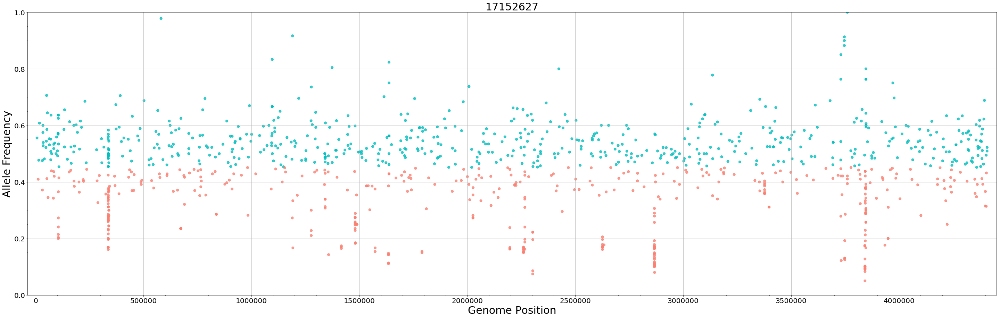

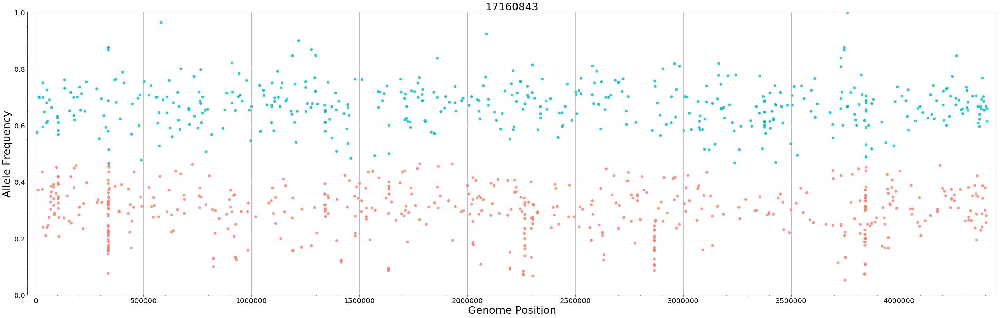

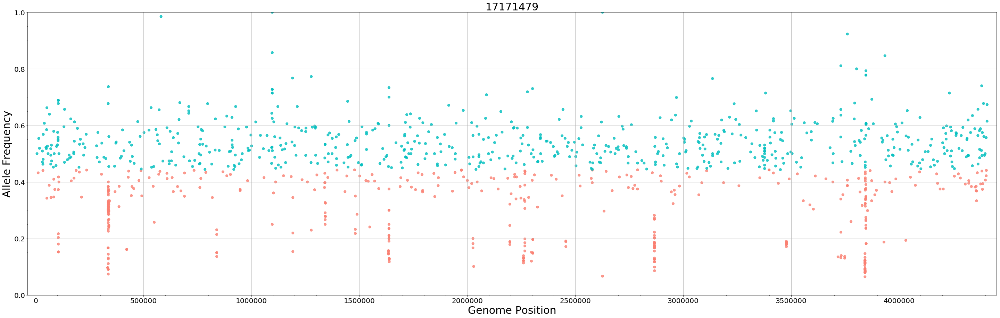

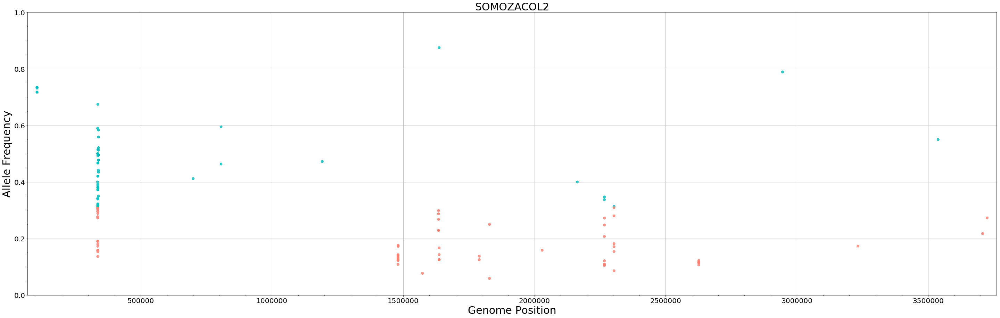

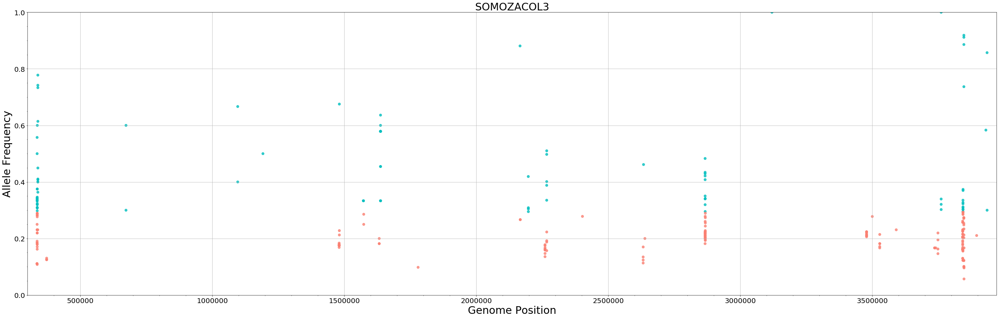

In [13]:
for name_dsf, df in dict_vcf.items():
    scatter_vcf_pos(df,name_dsf)

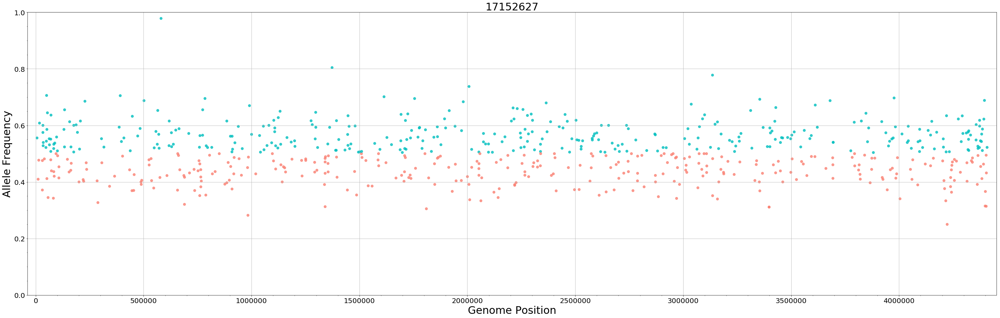

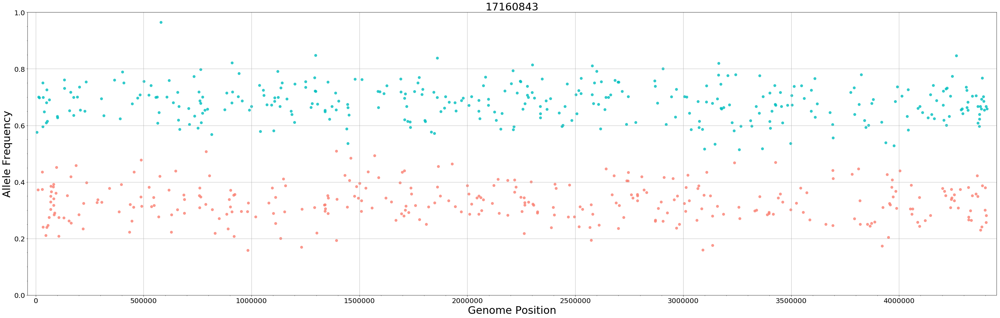

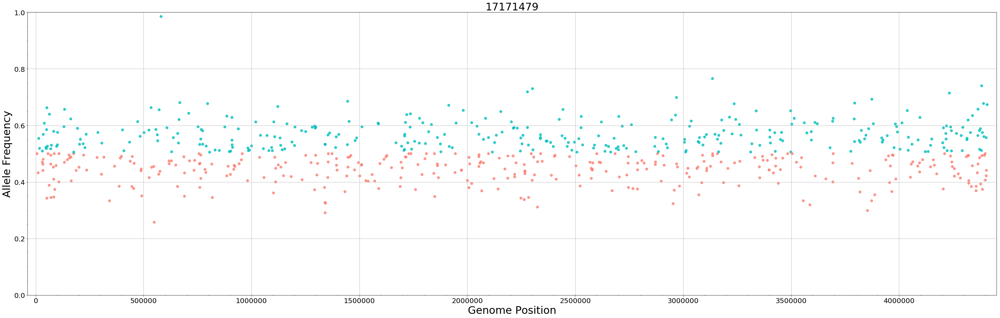

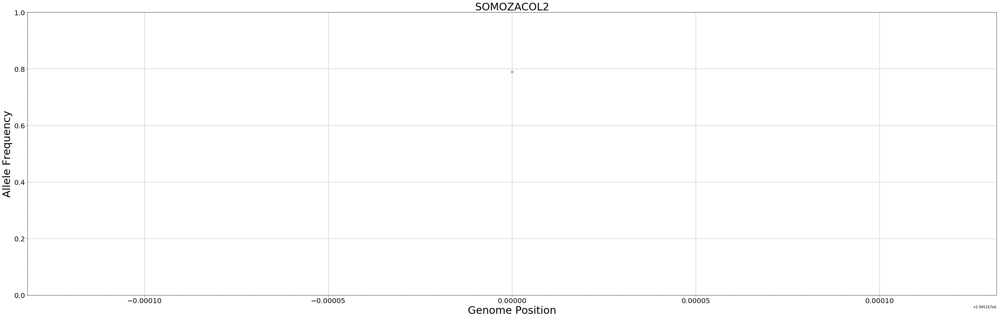

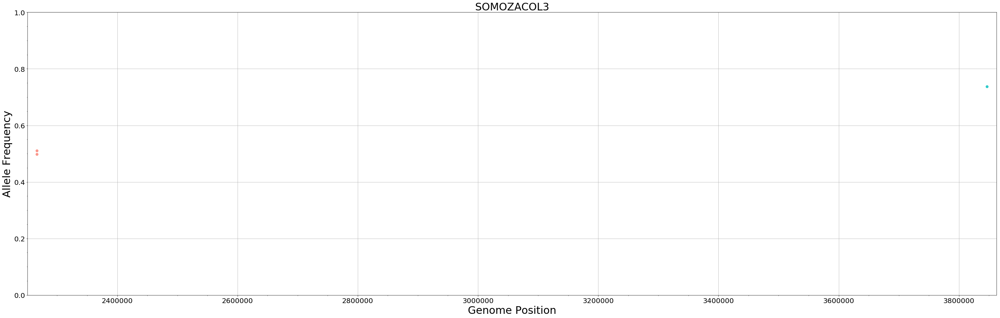

In [14]:
for name_dsf, df in dict_dff.items():
    scatter_vcf_pos(df,name_dsf)

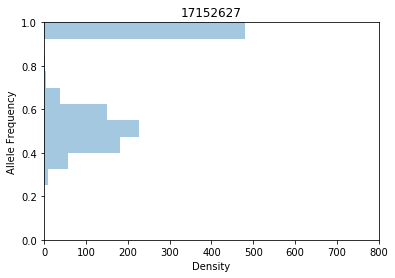

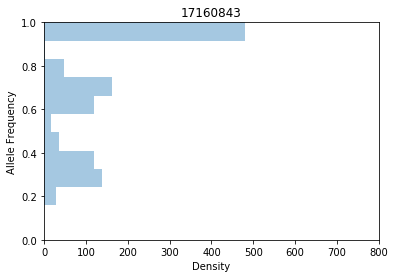

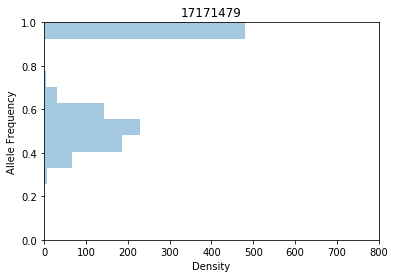

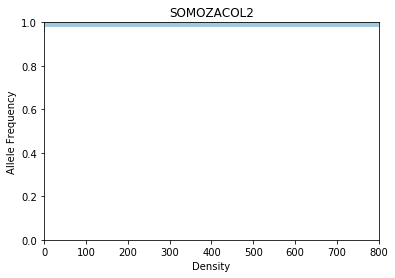

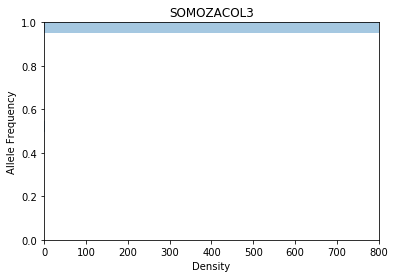

In [16]:
for name_dsf, df in dict_dff.items():
    distplot_sns(df,name_dsf)

In [17]:
def split_df_mean(vcf_df, homoz=0.95):
    filter_homoz_top = homoz
    filter_homoz_bottom = (1 - filter_homoz_top)
    
    #mean = vcf_df['AF'][(vcf_df['AF'] <= filter_homoz_top) & (vcf_df['AF'] >= filter_homoz_bottom)].mean(axis = 0)
    mean = vcf_df['AF'][(vcf_df.AC != 2) & (vcf_df.gt0 != 1)].mean(axis = 0)    


    top_positions = vcf_df['POS'][(vcf_df['AF'] >= mean) & (vcf_df.AC != 2) & (vcf_df.gt0 != 1)].tolist()
    bottom_positions = vcf_df['POS'][(vcf_df['AF'] < mean)].tolist()
    
    return top_positions, bottom_positions

In [18]:
dict_t_b = {}
for name_dff, df_dff in dict_dff.items():
    name_top = name_dff + "_t"
    name_btm = name_dff + "_b"
    name_top , name_btm = split_df_mean(df_dff)
    dict_t_b[name_dff] = name_top , name_btm

In [19]:
for k,v in dict_t_b.items():
    print(k,len(v[0]), len(v[1]))

17152627 339 330
17160843 346 323
17171479 328 342
SOMOZACOL2 1 0
SOMOZACOL3 1 2


# Create sets for comparing

In [21]:
S2 = set(dict_dff['SOMOZACOL2'].POS.values)
S3 = set(dict_dff['SOMOZACOL3'].POS.values)

In [23]:
S3_exclusive = S3 - S2
S2_exclusive = S2 - S3
Shared_2_3 = S2 & S3
total_difference_2_3 = (len(S2_exclusive) + len(S3_exclusive))
print("S2 has %s unique positions\n\
S3 has %s unique positions\n\
Both share %s positions\n\
Total difference: %s" % (len(S2_exclusive) , len(S3_exclusive), len(Shared_2_3),total_difference_2_3 ))

S2 has 388 unique positions
S3 has 334 unique positions
Both share 474 positions
Total difference: 722


# Use venn diagram to check disgregation

<Figure size 1440x720 with 0 Axes>

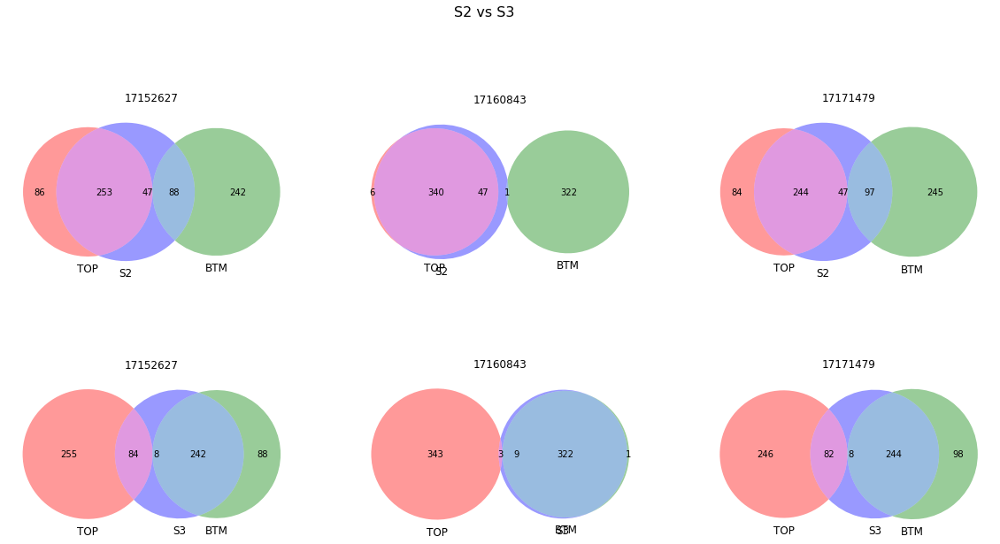

In [25]:
plt.figure(figsize=(20,10))

plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

# Start K-means clustering

### Thanks to: http://www.aprendemachinelearning.com/k-means-en-python-paso-a-paso/

In [26]:
dict_dff[sample_list[2]].describe()

,POS,QUAL,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GQ,BaseQRankSum,MQRankSum,ReadPosRankSum,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,snp_left_distance,snp_right_distance,Window_10
count,1.150000e+03,1150.000000,1150.000000,1150.000000,1150.0,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000,773.000000,773.000000,773.000000,1150.0,1150.000000,1150.000000,1150.000000,1150.0,1150.00000,1150.000000,1150.000000,1150.000000,1150.000000,1150.000000
mean,2.216662e+06,8428.377748,1.417391,0.708696,2.0,84.592174,3.638616,2.203011,59.792643,23.893574,0.776623,98.730435,-0.565188,0.004678,0.029177,2.0,24.416522,60.163478,0.417391,1.0,84.58000,0.288931,0.711069,3170.625217,3237.447826,1.026957
std,1.326345e+06,4690.961657,0.493343,0.246672,0.0,22.037466,0.845973,3.836210,1.465346,7.219673,0.269315,3.762584,2.802865,0.514025,0.792062,0.0,22.799987,27.379601,0.493343,0.0,22.03858,0.251796,0.251796,3358.120164,3467.754031,0.162027
min,2.532000e+03,932.140000,1.000000,0.500000,2.0,6.000000,0.248200,0.000000,40.000000,15.020000,0.088000,24.000000,-5.897000,-5.952000,-2.489000,2.0,0.000000,3.000000,0.000000,1.0,6.00000,0.000000,0.257426,3.000000,3.000000,1.000000
25%,1.097398e+06,4571.125000,1.000000,0.500000,2.0,71.000000,3.010300,0.000000,60.000000,17.290000,0.630250,99.000000,-3.017000,0.000000,-0.544000,2.0,0.000000,39.000000,0.000000,1.0,71.00000,0.000000,0.490096,798.000000,817.000000,1.000000
50%,2.214756e+06,6635.680000,1.000000,0.500000,2.0,85.000000,3.521800,0.464000,60.000000,20.470000,0.758000,99.000000,-1.509000,0.000000,0.022000,2.0,28.500000,52.000000,0.000000,1.0,85.00000,0.407587,0.592413,2135.500000,2174.000000,1.000000
75%,3.339890e+06,12297.760000,2.000000,1.000000,2.0,98.000000,4.771200,3.319000,60.000000,32.150000,0.908750,99.000000,1.800000,0.000000,0.584000,2.0,44.000000,81.000000,1.000000,1.0,98.00000,0.509904,1.000000,4390.750000,4397.500000,1.000000
max,4.408923e+06,28031.010000,2.000000,1.000000,2.0,209.000000,11.972800,49.433000,60.000000,38.060000,2.363000,99.000000,5.700000,8.310000,2.710000,2.0,105.000000,209.000000,1.000000,1.0,209.00000,0.742574,1.000000,28663.000000,28663.000000,2.000000


/home/laura/env36/lib/python3.6/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


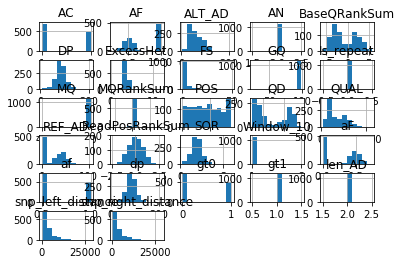

In [27]:
dict_dff[sample_list[2]].hist()
plt.show()

In [32]:
def assign_group_somoza(row):
    if row.POS in S2_exclusive:
        return 1
    elif row.POS in S3_exclusive:
        return 2
    else:
        return 3


In [33]:
print(dict_dff.keys())

dict_keys(['17152627', '17160843', '17171479', 'SOMOZACOL2', 'SOMOZACOL3'])


In [34]:
Ktest15 = dict_dff['17152627'][(dict_dff['17152627'].AC != 2) & (dict_dff['17152627'].gt0 != 1)]
Ktest16 = dict_dff['17160843'][(dict_dff['17160843'].AC != 2) & (dict_dff['17160843'].gt0 != 1)]
Ktest17 = dict_dff['17171479'][(dict_dff['17171479'].AC != 2) & (dict_dff['17171479'].gt0 != 1)]



In [35]:
Ktest15.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
1,MTB_anc,6140,.,G,T,3859.44,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.063e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:32,40:72:99:1222,0,1083",1.0,0.5,2.0,72.0,4.7712,7.877,60.0,15.38,0.529,0/1,"32,40",99.0,"1222,0,1083",-3.063,0.0,0.539,NaN,NaN,NaN,2,32.0,40.0,0,1,72.0,0.444444,0.555556,False,3608.0,3003.0,1
3,MTB_anc,11370,.,C,T,5862.18,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.704e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:49,34:83:99:857,0,1593",1.0,0.5,2.0,83.0,3.5218,1.230,60.0,15.93,0.753,0/1,"49,34",99.0,"857,0,1593",-3.704,0.0,1.740,NaN,NaN,NaN,2,49.0,34.0,0,1,83.0,0.590361,0.409639,False,2227.0,2090.0,1
5,MTB_anc,14251,.,G,A,3010.44,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.222e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:34,31:65:99:805,0,1057",1.0,0.5,2.0,65.0,4.7712,2.538,60.0,15.84,0.685,0/1,"34,31",99.0,"805,0,1057",-2.222,0.0,0.112,NaN,NaN,NaN,2,34.0,31.0,0,1,65.0,0.523077,0.476923,False,791.0,150.0,1
8,MTB_anc,17608,.,G,C,3796.44,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.496e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:29,45:74:99:1198,0,855",1.0,0.5,2.0,74.0,4.7712,12.368,60.0,16.58,0.303,0/1,"29,45",99.0,"1198,0,855",-1.496,0.0,1.110,NaN,NaN,NaN,2,29.0,45.0,0,1,74.0,0.391892,0.608108,False,2491.0,4211.0,1
12,MTB_anc,30943,.,C,T,4648.18,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.851e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:44,26:70:99:520,0,1313",1.0,0.5,2.0,70.0,3.5218,4.501,60.0,15.29,0.952,0/1,"44,26",99.0,"520,0,1313",-2.851,0.0,-0.196,NaN,NaN,NaN,2,44.0,26.0,0,1,70.0,0.628571,0.371429,False,3474.0,134.0,1


In [36]:
Ktest15['category'] = Ktest15.apply(assign_group_somoza, axis=1)
Ktest16['category'] = Ktest16.apply(assign_group_somoza, axis=1)
Ktest17['category'] = Ktest17.apply(assign_group_somoza, axis=1)


/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http:

In [37]:
Ktest15[Ktest15.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,DP,ExcessHet,FS,MQ,QD,SOR,GT,AD,GQ,PL,BaseQRankSum,MQRankSum,ReadPosRankSum,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
277,MTB_anc,580772,.,T,A,11100.22,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.337;DP=46;Ex...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:1,45:46:99:0|1:580772_T_A:1839,0,143:580772",1.0,0.5,2.0,46.0,4.7712,2.086,58.92,36.33,1.452,0|1,"1,45",99.0,"1839,0,143",0.337,-0.283,0.517,0|1,580772_T_A,580772,2,1.0,45.0,0,1,46.0,0.021739,0.978261,False,5093.0,3399.0,1,3
1048,MTB_anc,2737572,.,A,C,3301.01,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.38;DP=35;Exc...,GT:AD:DP:GQ:PL,"0/1:14,21:35:99:675,0,361",1.0,0.5,2.0,35.0,4.8280,3.426,60.00,17.84,0.487,0/1,"14,21",99.0,"675,0,361",2.380,0.000,-0.810,NaN,NaN,NaN,2,14.0,21.0,0,1,35.0,0.400000,0.600000,False,1138.0,1602.0,1,3


In [38]:
Ktest15 = Ktest15[Ktest15.category != 3]
Ktest16 = Ktest16[Ktest16.category != 3]
Ktest17 = Ktest17[Ktest17.category != 3]


In [39]:
Ktest15.gt0[Ktest15.category == 1].value_counts()

0    341
Name: gt0, dtype: int64

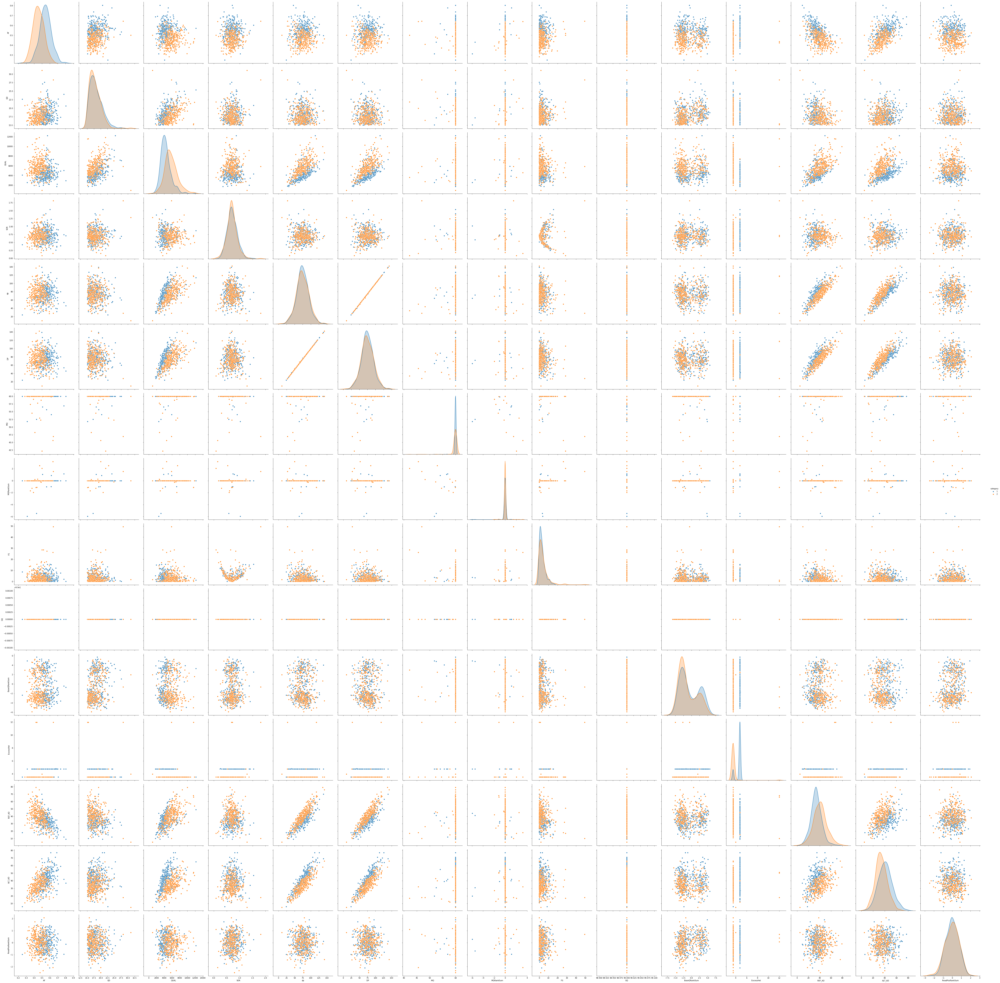

In [41]:
sns.pairplot(Ktest15, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


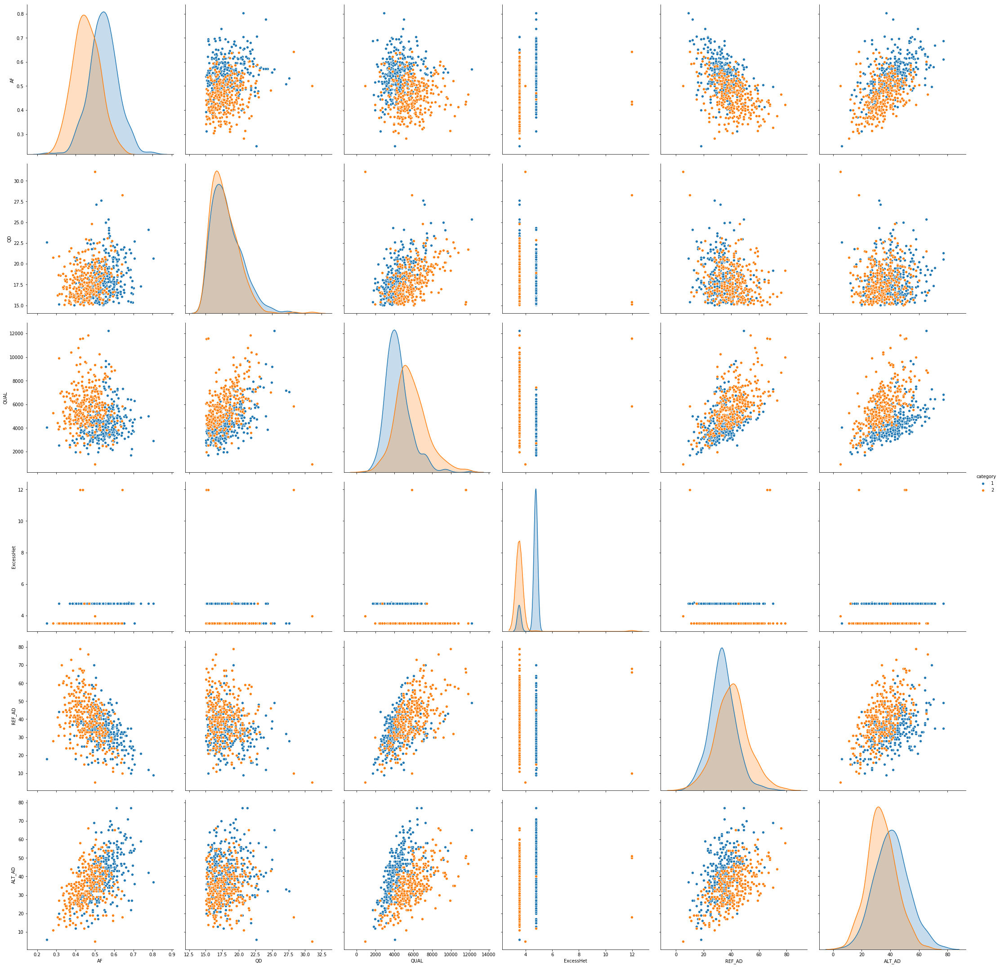

In [209]:
sns.pairplot(Ktest15, hue='category',size=5,vars=["AF","QD", "QUAL", "ExcessHet","REF_AD", "ALT_AD"],kind='scatter')

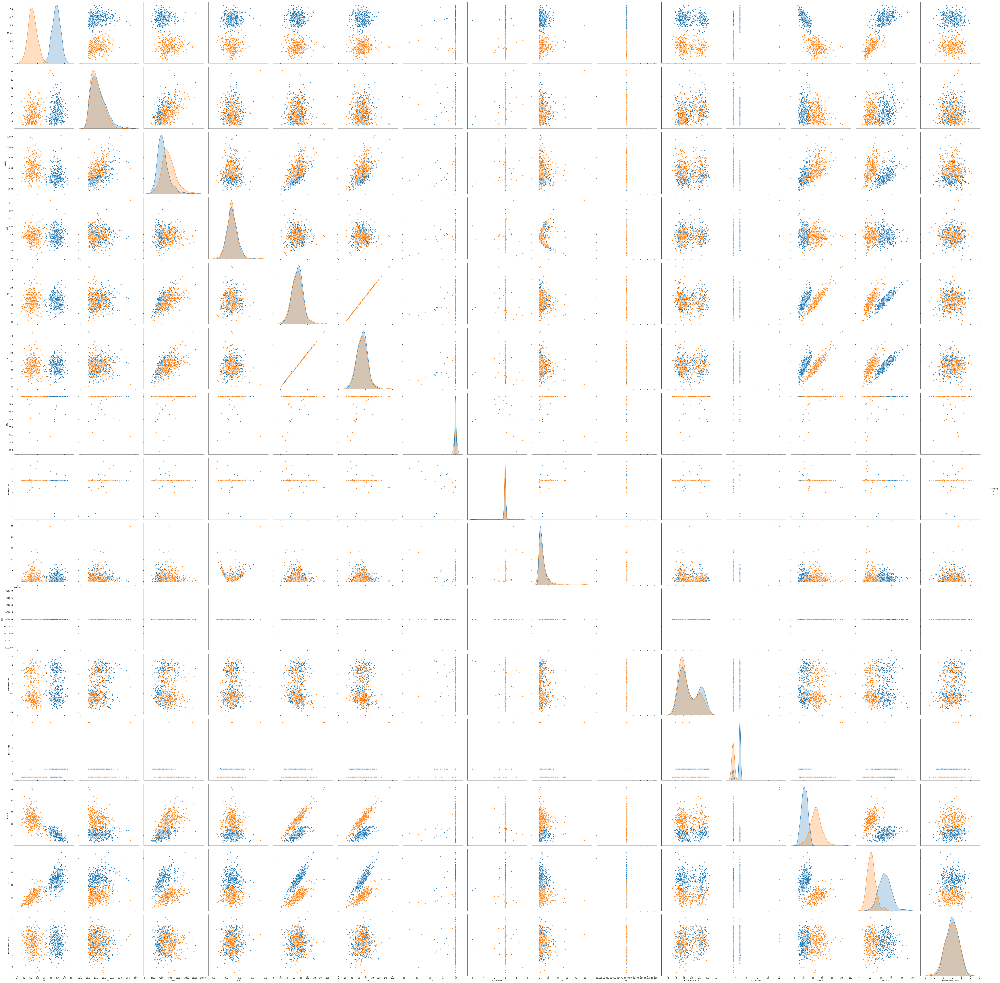

In [43]:
sns.pairplot(Ktest16, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

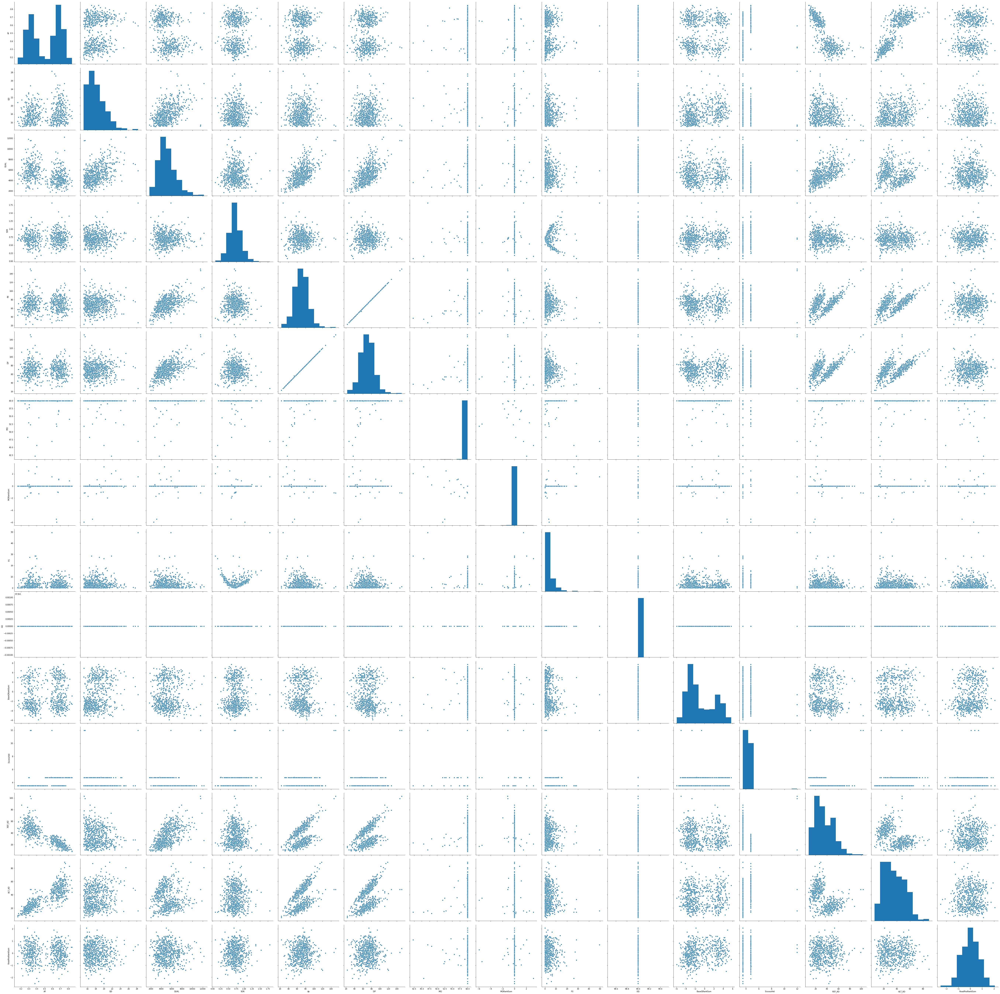

In [210]:
sns.pairplot(Ktest16,size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


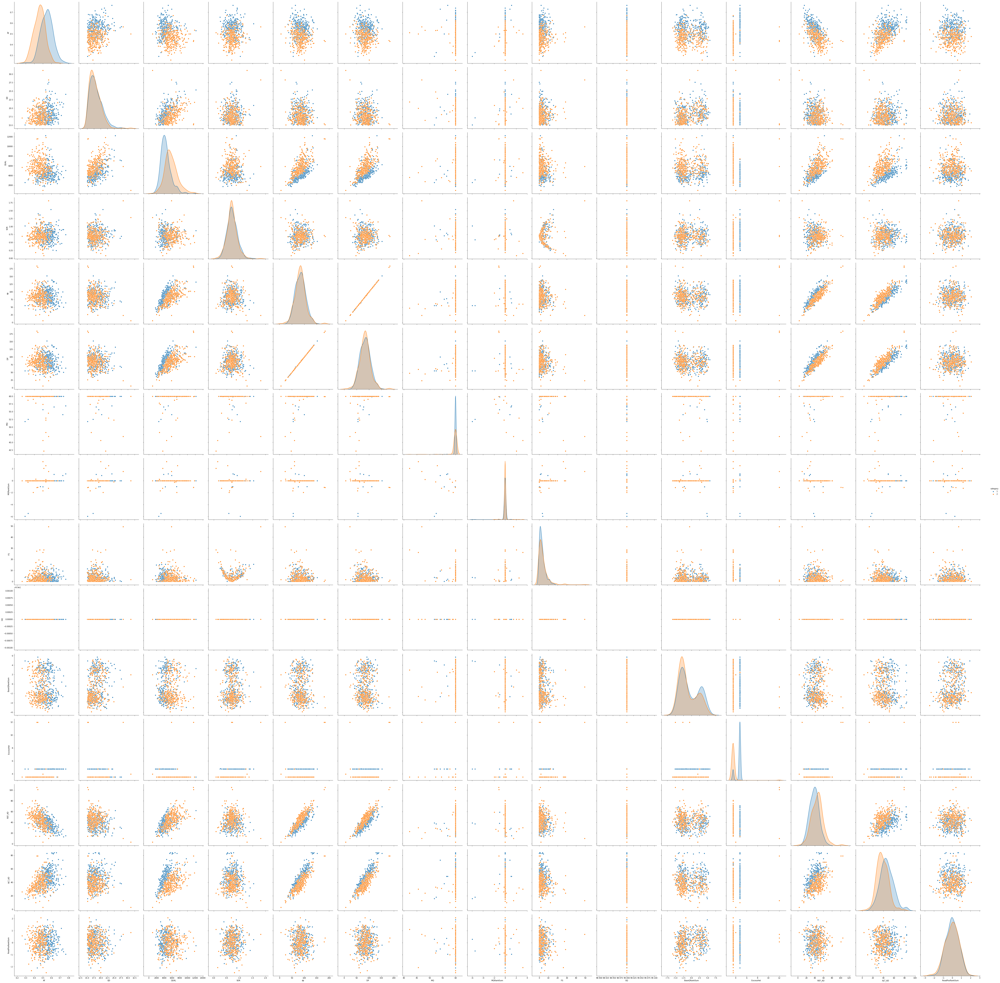

In [56]:
sns.pairplot(Ktest17, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

In [78]:
X = np.array(Ktest15[["AF","QUAL", "ALT_AD", "QD"]])
y = np.array(Ktest15['category'])
X.shape

(667, 4)

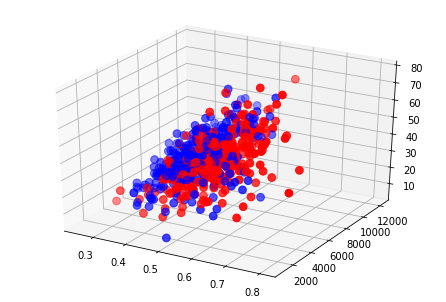

In [79]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y:
    assign.append(colors[row - 1])
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)

In [80]:
X16 = np.array(Ktest16[["AF","QUAL", "ALT_AD", "QD"]])
y16 = np.array(Ktest16['category'])
X16.shape

(666, 4)

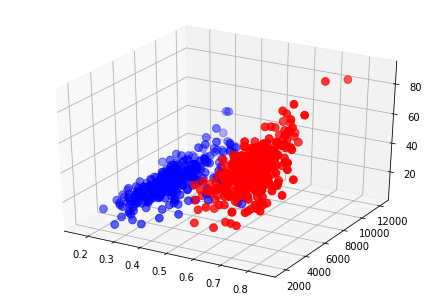

In [81]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y16:
    assign.append(colors[row - 1])
ax.scatter(X16[:, 0], X16[:, 1], X16[:, 2], c=assign,s=60)

In [82]:
X17 = np.array(Ktest17[["AF","QUAL", "ALT_AD"]])
y17 = np.array(Ktest17['category'])
X17.shape

(667, 3)

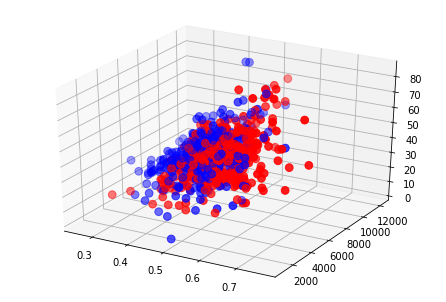

In [83]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y17:
    assign.append(colors[row - 1])
ax.scatter(X17[:, 0], X17[:, 1], X17[:, 2], c=assign,s=60)

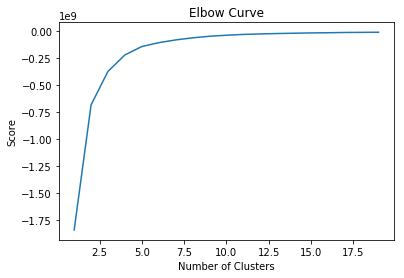

In [84]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [139]:
X = np.array(Ktest15[["QUAL", "ExcessHet", "AF","QD", "ALT_AD","REF_AD", "MQ"]])
y = np.array(Ktest15['category'])
X

array([[3.85944000e+03, 4.77120000e+00, 5.55555556e-01, ...,
        4.00000000e+01, 3.20000000e+01, 6.00000000e+01],
       [5.86218000e+03, 3.52180000e+00, 4.09638554e-01, ...,
        3.40000000e+01, 4.90000000e+01, 6.00000000e+01],
       [3.01044000e+03, 4.77120000e+00, 4.76923077e-01, ...,
        3.10000000e+01, 3.40000000e+01, 6.00000000e+01],
       ...,
       [9.90418000e+03, 3.52180000e+00, 3.13953488e-01, ...,
        2.70000000e+01, 5.90000000e+01, 6.00000000e+01],
       [7.58718000e+03, 3.52180000e+00, 4.31818182e-01, ...,
        3.80000000e+01, 5.00000000e+01, 6.00000000e+01],
       [5.21144000e+03, 4.77120000e+00, 5.22222222e-01, ...,
        4.70000000e+01, 4.30000000e+01, 6.00000000e+01]])

In [140]:
X = StandardScaler().fit_transform(X)
X

array([[3.85944000e+03, 4.77120000e+00, 5.55555556e-01, ...,
        4.00000000e+01, 3.20000000e+01, 6.00000000e+01],
       [5.86218000e+03, 3.52180000e+00, 4.09638554e-01, ...,
        3.40000000e+01, 4.90000000e+01, 6.00000000e+01],
       [3.01044000e+03, 4.77120000e+00, 4.76923077e-01, ...,
        3.10000000e+01, 3.40000000e+01, 6.00000000e+01],
       ...,
       [9.90418000e+03, 3.52180000e+00, 3.13953488e-01, ...,
        2.70000000e+01, 5.90000000e+01, 6.00000000e+01],
       [7.58718000e+03, 3.52180000e+00, 4.31818182e-01, ...,
        3.80000000e+01, 5.00000000e+01, 6.00000000e+01],
       [5.21144000e+03, 4.77120000e+00, 5.22222222e-01, ...,
        4.70000000e+01, 4.30000000e+01, 6.00000000e+01]])

In [141]:
kmeans = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X)
centroids = kmeans.cluster_centers_
print(centroids)

[[4.16576622e+03 4.27991486e+00 5.09284326e-01 1.74907207e+01
  3.53963964e+01 3.37004505e+01 5.98173198e+01]
 [6.96011857e+03 3.75314709e+00 4.88873246e-01 1.93042152e+01
  4.22690583e+01 4.41434978e+01 5.98369058e+01]]


In [142]:
kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

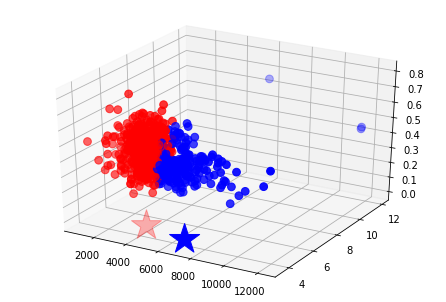

In [143]:
# Predicting the clusters
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)
ax.scatter(C[:, 0], C[:, 1], marker='*', c=colors, s=1000)

In [144]:
Ktest15.columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'DP', 'ExcessHet', 'FS', 'MQ', 'QD', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'BaseQRankSum', 'MQRankSum', 'ReadPosRankSum',
       'PGT', 'PID', 'PS', 'len_AD', 'REF_AD', 'ALT_AD', 'gt0', 'gt1', 'dp',
       'aF', 'AF', 'Is_repeat', 'snp_left_distance', 'snp_right_distance',
       'Window_10', 'category'],
      dtype='object')

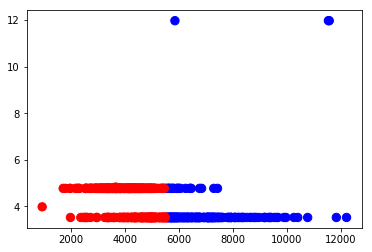

In [145]:
# Getting the values and plotting it
f1 = Ktest15['QUAL'].values
f2 = Ktest15['ExcessHet'].values

plt.scatter(f1, f2, c=assign, s=70)
#plt.scatter(C[:, 0], C[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [177]:
X16 = np.array(Ktest16[["AF","QUAL", "ALT_AD", "REF_AD", "QD", "MQ"]])
y16 = np.array(Ktest16['category'])
X16 = StandardScaler().fit_transform(X16)

X16

array([[ 0.35241495, -0.75305191,  0.39012277, -0.21809335, -1.26853743,
         0.13326211],
       [-0.73428255,  0.45655131, -0.4349097 ,  0.92811581, -1.00989721,
         0.13326211],
       [ 1.01793512, -1.26582597,  0.39012277, -1.04591108, -1.05222015,
         0.13326211],
       ...,
       [-1.35029657,  2.89781487, -1.00608602,  1.50122039,  1.34608007,
         0.13326211],
       [-1.21955702,  1.49840674, -0.68876584,  1.88329012, -0.04587457,
         0.13326211],
       [ 0.79492245,  0.06352116,  1.02476313, -0.4728065 ,  0.67831805,
         0.13326211]])

In [165]:
kmeans16 = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X16)
centroids16 = kmeans16.cluster_centers_
print(centroids16)

[[-0.97823993  0.44098795 -0.81232239  0.82244965 -0.11556048 -0.03577421]
 [ 0.90473057 -0.40785013  0.75128082 -0.76064708  0.10687674  0.03308597]]


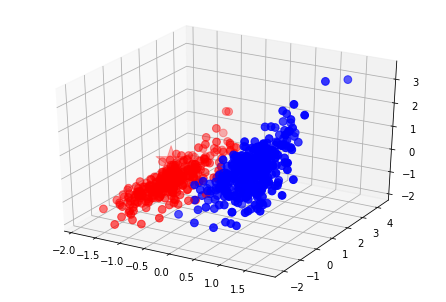

In [166]:
# Predicting the clusters
labels16 = kmeans16.predict(X16)
# Getting the cluster centers
C16 = kmeans16.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels16:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X16[:, 0], X16[:, 1], X16[:, 2], c=assign,s=60)
ax.scatter(C16[:, 0], C16[:, 1], marker='*', c=colors, s=1000)

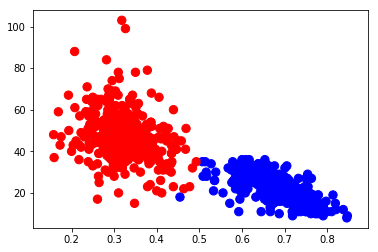

In [167]:
# Getting the values and plotting it
f1 = Ktest16['AF'].values
f2 = Ktest16['REF_AD'].values

plt.scatter(f1, f2, c=assign, s=70)
#plt.scatter(C16[:, 0], C16[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [169]:
copy =  pd.DataFrame()
copy['POS']=Ktest16['POS'].values
copy['AF']=Ktest16['AF'].values
copy['category']=Ktest16['category'].values
copy['label'] = labels16;
Ngrouped =  pd.DataFrame()
Ngrouped['colors']=colors
Ngrouped['N']=copy.groupby('label').size()
Ngrouped

,colors,N
0,red,320
1,blue,346


In [170]:
copy.head()

,POS,AF,category,label
0,6140,0.575342,1,1
1,11370,0.371795,2,0
2,14251,0.700000,1,1
3,17608,0.697368,1,1
4,30943,0.373333,2,0


In [65]:
 #metrics.adjusted_rand_score(labels_true, labels_pred)

# Compute Affinity Propagation

In [171]:
# #############################################################################
# Compute Affinity Propagation
X = X16
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))


Estimated number of clusters: 12
Silhouette Coefficient: 0.371


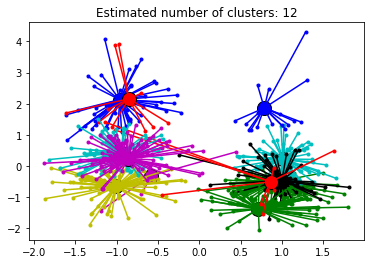

In [172]:

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Compute Agglomerative Clustering

In [204]:
X16 = np.array(Ktest16[["AF", "ALT_AD","QUAL", "QD"]])
X16 = StandardScaler().fit_transform(X16)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X16)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_
Ktest16['Label'] = labels

In [205]:
X15 = np.array(Ktest15[["AF", "ExcessHet","ALT_AD","QUAL", "QD"]])
X15 = StandardScaler().fit_transform(X15)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X15)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_
Ktest15['Label'] = labels

In [206]:
X17 = np.array(Ktest17[["AF", "ExcessHet","ALT_AD","QUAL", "QD"]])
X17 = StandardScaler().fit_transform(X17)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X17)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_
Ktest17['Label'] = labels

<Figure size 1440x720 with 0 Axes>

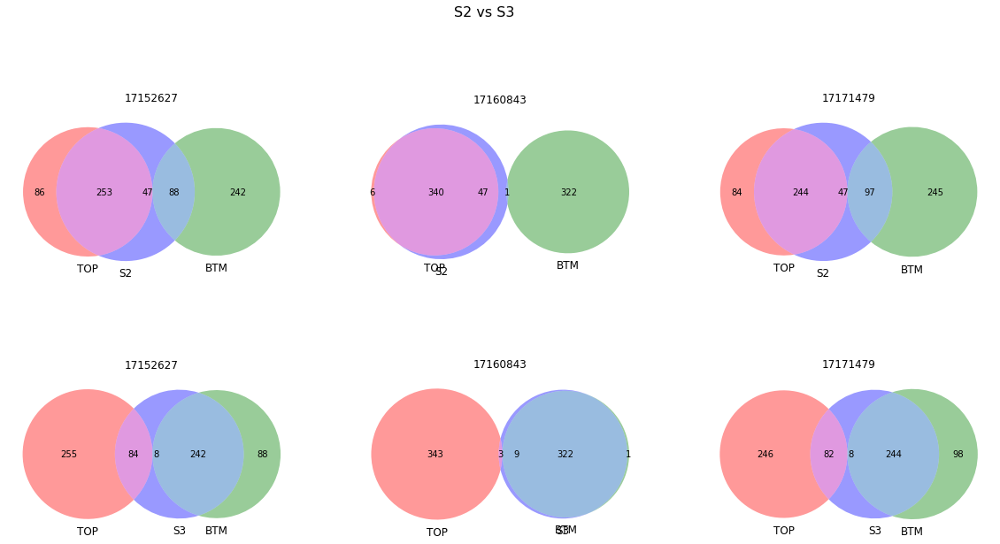

In [207]:
plt.figure(figsize=(20,10))

plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

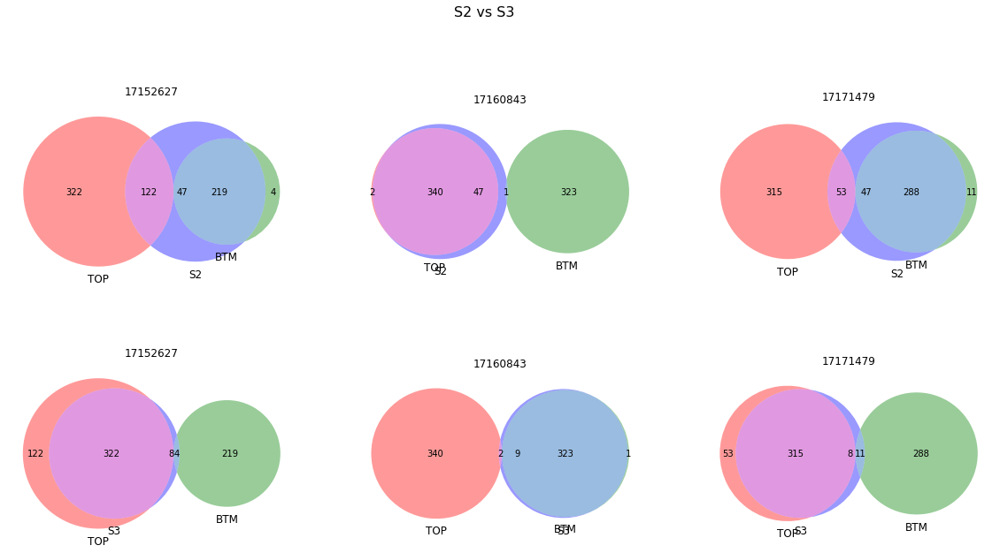

In [208]:
plt.figure(figsize=(20,10))


plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))


#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

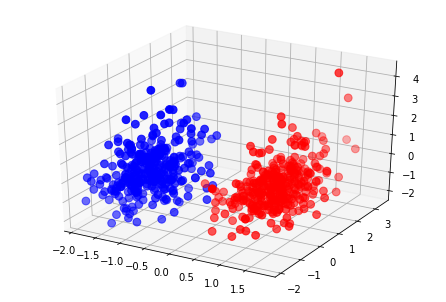

In [182]:
# Predicting the clusters

# Getting the cluster centers
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X16[:, 0], X16[:, 1], X16[:, 2], c=assign,s=60)


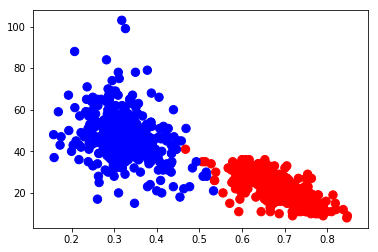

In [183]:
# Getting the values and plotting it
f1 = Ktest16['AF'].values
f2 = Ktest16['REF_AD'].values

colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

plt.scatter(f1, f2, c=assign, s=70)
plt.show()

In [92]:
#corr_PCA_col.append(maxValuesObj, ignore_index=True)

# Feature Selection

https://towardsdatascience.com/feature-selection-techniques-in-machine-learning-with-python-f24e7da3f36e

## 1. Univariate Selection 15

In [48]:
X = Ktest15[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y = Ktest15['category']    #target column i.e price range

In [49]:
X.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD
1,0.555556,15.38,3859.44,0.529,72.0,72.0,60.0,7.877,99.0,4.7712,32.0,40.0
3,0.409639,15.93,5862.18,0.753,83.0,83.0,60.0,1.230,99.0,3.5218,49.0,34.0
5,0.476923,15.84,3010.44,0.685,65.0,65.0,60.0,2.538,99.0,4.7712,34.0,31.0
8,0.608108,16.58,3796.44,0.303,74.0,74.0,60.0,12.368,99.0,4.7712,29.0,45.0
12,0.371429,15.29,4648.18,0.952,70.0,70.0,60.0,4.501,99.0,3.5218,44.0,26.0


In [50]:
X[X.values < 0]

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD


In [51]:
#apply SelectKBest class to extract top 12 best features
bestfeatures = SelectKBest(score_func=chi2, k=12)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  62099.554207
11     ALT_AD    212.453941
10     REF_AD    207.619410
9   ExcessHet     38.097358
7          FS     18.757532
0          AF      2.600810
1          QD      1.046886
6          MQ      0.074426
3         SOR      0.045256
4          dp      0.034846
5          DP      0.032860
8          GQ      0.000000


## 1. Univariate Selection 16

In [52]:
X16 = Ktest16[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y16 = Ktest16['category']    #target column i.e price range

In [53]:
#apply SelectKBest class to extract top 12 best features
bestfeatures16 = SelectKBest(score_func=chi2, k=12)
fit16 = bestfeatures.fit(X16,y16)
dfscores16 = pd.DataFrame(fit16.scores_)
dfcolumns16 = pd.DataFrame(X16.columns)
#concat two dataframes for better visualization 
featureScores16 = pd.concat([dfcolumns16,dfscores16],axis=1)
featureScores16.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores16.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  63280.384391
11     ALT_AD   2902.319276
10     REF_AD   2887.289601
0          AF     40.481263
9   ExcessHet     38.125446
7          FS     19.098857
1          QD      1.312485
5          DP      0.783778
4          dp      0.760041
6          MQ      0.075038
3         SOR      0.057663
8          GQ      0.000000


## 1. Univariate Selection 17

In [54]:
X17 = Ktest17[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y17 = Ktest17['category']    #target column i.e price range

In [55]:
#apply SelectKBest class to extract top 12 best features
bestfeatures17 = SelectKBest(score_func=chi2, k=12)
fit17 = bestfeatures.fit(X17,y17)
dfscores17 = pd.DataFrame(fit17.scores_)
dfcolumns17 = pd.DataFrame(X17.columns)
#concat two dataframes for better visualization 
featureScores17 = pd.concat([dfcolumns17,dfscores17],axis=1)
featureScores17.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores17.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  62099.554207
11     ALT_AD    249.229034
10     REF_AD    180.929838
9   ExcessHet     38.097358
7          FS     18.757532
4          dp      2.945452
5          DP      2.928362
0          AF      2.395687
1          QD      1.046886
6          MQ      0.074426
3         SOR      0.045256
8          GQ      0.000000


# 2. Feature Importance

In [57]:
X = Ktest15[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest15['category']    #target column i.e price range

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[0.10884788 0.06491406 0.14392596 0.02257088 0.02372139 0.02147149
 0.00677392 0.02271874 0.         0.42211242 0.05129659 0.05919217
 0.02754073 0.00487053 0.02004325]


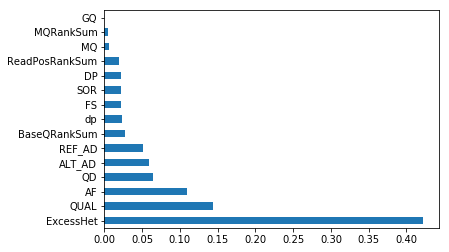

In [58]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [60]:
X = Ktest16[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest16['category']    #target column i.e price range

[0.36660179 0.01061102 0.04026714 0.00120826 0.0094976  0.02166766
 0.00287352 0.00191761 0.         0.10528318 0.22819166 0.20134112
 0.00568626 0.0013091  0.00354408]


/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


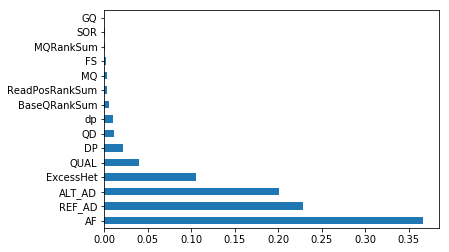

In [61]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [62]:
X = Ktest17[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest17['category']    #target column i.e price range

[0.09491769 0.05502439 0.0890196  0.02736557 0.02193271 0.0261581
 0.00809677 0.02150334 0.         0.53209273 0.03193    0.0431419
 0.02157929 0.0065594  0.02067852]


/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


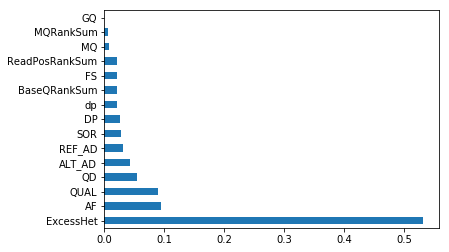

In [63]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()